## Visualization of spatial resources with _TemplateFlow_

This notebook showcases how _TemplateFlow_ can facilitate visualization of spatially standardized data, including template and atlas resources. We begin by importing the _TemplateFlow_ API, along with `nibabel` for reading neuroimaging data files, `matplotlib` for plotting, and a number of plotting functions from the `nilearn` and `niworkflows` packages.

In [1]:
import templateflow.api as tflow
import nibabel as nb
import matplotlib.pyplot as plt
from niworkflows.viz.utils import (
    plot_registration,
    plot_segs,
    compose_view,
    cuts_from_bbox
)
from IPython.display import SVG, Image, display
from templateplot import plot_all_templates

In [2]:
import templateflow
templateflow.conf.wipe()

### Visualising a template

In addition to numerous human template resources, _TemplateFlow_ includes the `Fischer344` rodent template for use with preclinical imaging workflows. Let's start by creating a mosaic plot of this template. To do this, we begin by using the _TemplateFlow_ client to retrieve the T2-weighted image (`suffix='T2w'`) of the Fischer template. We also retrieve a brain mask (`desc='brain', suffix='mask'`); this will be used to determine the sections of the brain to be visualised.

_Note:_ Some templates might have several different resolutions; in this case, a `resolution` argument should be used to specify the desired resolution. (Resolutions are defined in the `template_description.json` metadata file.)

In [3]:
uid = 'Fischer344'
nii = nb.load(tflow.get(uid, desc=None, suffix='T2w'))
mask_nii = nb.load(tflow.get(uid, hemi=None, desc='brain', suffix='mask'))

100%|██████████| 43.8M/43.8M [00:02<00:00, 16.1MB/s]
100%|██████████| 514k/514k [00:00<00:00, 1.75MB/s]


Next, we use the `plot_registration` function from `niworkflows` to create a mosaic SVG plot of the `Fischer344` brain. This plot will include axial, sagittal, and coronal slices. The number of slices is set by `n_cuts`, and the positions of the slices is determined by the `niworkflows` utility function `cuts_from_bbox`.

In [4]:
n_cuts = 7
cuts = cuts_from_bbox(mask_nii, cuts=n_cuts)
figs = plot_registration(
    nii,
    'fixed-image',
    estimate_brightness=True,
    cuts=cuts,
    label=uid,
    contour=mask_nii,
    compress='auto',
    dismiss_affine=False,
)

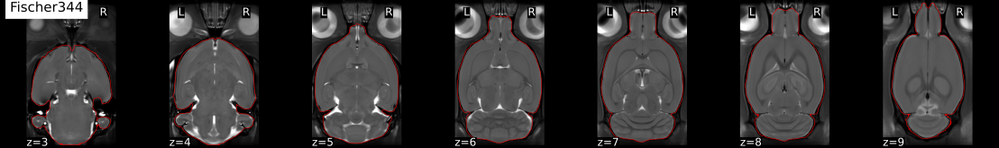

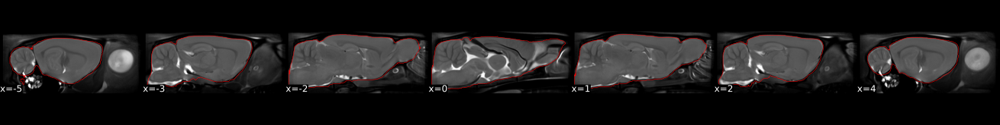

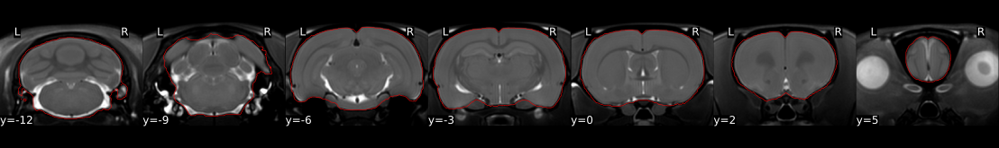

In [5]:
for i, fig in enumerate(figs):
    fig.save(f'/tmp/tpl-{uid}_view{i}.svg')
    display(SVG(filename=f'/tmp/tpl-{uid}_view{i}.svg'))

<hr>

### Segmentation overlay

Most templates in _TemplateFlow_ are distributed with segmentations. Discrete segmentations (`suffix='dseg'`) are voxelwise annotations that assign each voxel of the brain to a single region or tissue class. Probabilistic segmentations (`suffix='probseg'`) instead assign each voxel to a categorical distribution over tissue classes or regions.

Let's visualise the tissue classes present in the `Fischer344` brain. To do this, we'll use a 4-way probabilistic segmentation into grey matter, white matter, cerebrospinal fluid, and a catch-all 'other' category to delineate boundary contours of each tissue class. We begin by retrieving the probabilistic segmentations using the _TemplateFlow_ API. Now, we use another plotting function from `niworkflows` designed for this purpose, `plot_segs`, again selecting the slices to be plotted with guidance from the mask (`bbox_nii` argument).

In [6]:
probseg_nii = [str(path) for path in tflow.get('Fischer344', suffix='probseg')]

figs = plot_segs(
    image_nii=str(tflow.get(uid, desc=None, suffix='T2w')),
    seg_niis=probseg_nii,
    bbox_nii=str(tflow.get(uid, hemi=None, desc='brain', suffix='mask')),
    out_file=f'/tmp/tpl-{uid}_seg.svg'
)

100%|██████████| 37.7M/37.7M [00:02<00:00, 14.9MB/s]
100%|██████████| 29.1M/29.1M [00:02<00:00, 14.1MB/s]
100%|██████████| 37.9M/37.9M [00:04<00:00, 8.58MB/s]
100%|██████████| 39.3M/39.3M [00:07<00:00, 5.61MB/s]


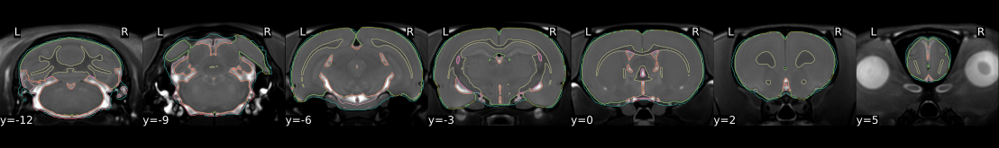

In [7]:
for i, fig in enumerate(figs):
    fig.save(f'/tmp/tpl-{uid}_seg{i}.svg')
    display(SVG(filename=f'/tmp/tpl-{uid}_seg{i}.svg'))

### Atlas overlay

In addition to tissue-class annotations, many templates are distributed with atlases, which associate with each spatial coordinate a particular annotation or set of annotations. Atlases include _inter alia_ anatomical parcellations (e.g., annotations of gyri and sulci) and functional parcellations (e.g., annotations of brain networks, or regions displaying homogeneous activity or preferential connectivity).

Here, we'll visualise a functional atlas: the 100-region cortical parcellation of Schaefer and colleagues (2018), which is situated in the stereotaxic coordinate space of the `MNI152NLin2009cAsym` template. We use the `atlas` argument to the _TemplateFlow_ API to specify the atlas family, and here we additionally use the `desc` argument to disambiguate among atlases within the family. (The Schaefer parcellation has several different resolutions and parcel numbering schemes, so this disambiguation is required.) Finally, because the atlas deterministically assigns each voxel coordinate to a single parcel, we again specify `suffix='dseg'`.

In [8]:
from nilearn import plotting

uid = 'MNI152NLin2009cAsym'
nii = nb.load(tflow.get(uid, resolution=1, desc=None, suffix='T1w'))
atlas_nii = nb.load(tflow.get(
    uid, resolution=1,
    desc='100Parcels7Networks',
    atlas='Schaefer2018',
    suffix='dseg'
))

100%|██████████| 13.7M/13.7M [00:01<00:00, 12.2MB/s]
100%|██████████| 415k/415k [00:00<00:00, 1.43MB/s]


Now, we'll use `nilearn`'s `plot_roi` function to create a mosaic view of the atlas. This function is used for visualising regions of interest (ROIs). We set the background image to be the template T1 we retrieved above and the ROI image to be the atlas.

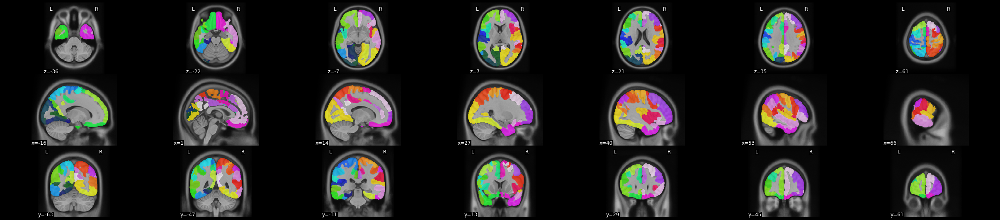

In [9]:
%matplotlib inline

plotting.plot_roi(roi_img=atlas_nii, bg_img=nii, display_mode='mosaic')

### Template-to-template transformations

To support the flow of spatial knowledge and annotations among template spaces, _TemplateFlow_ aims to compute template-to-template transformations. These transformations would map each coordinate in a particular template's coordinate space to its analogue in the spaces engendered by all other suitable templates. Such transformations could, for instance, be used to move the Schaefer parcellation above into the coordinate space of a pediatric or infant template, thereby enabling its use with additional study populations.

Here, we'll visualise the product of such a template-to-template transformation. This transformation links the version of the MNI template distributed with FSL, `MNI152NLin6Asym`, to the ICBM's `MNI152NLin2009cAsym` template. To visualise this registration, we'll first use the template-to-template transform to warp the FSL template (`MNI152NLin6Asym`) into ICBM space (`MNI152NLin2009cAsym`). For this, we use the command-line tool `antsApplyTransforms`. We can use inline calls to the _TemplateFlow_ API to retrieve the template-to-template transform, the input template, and the reference template, and then use these to populate the call to `antsApplyTransforms`.

In [10]:
%%bash

template_src='MNI152NLin6Asym'
template_dst='MNI152NLin2009cAsym'

transform=$(
    python -c "
import templateflow.api as tflow
import re
xfm = [
    path for path in tflow.get('${template_dst}',  mode='image', suffix='xfm')
    if re.search('.*from-${template_src}.*', str(path))
]
print(xfm[0])
    "
)

input=$(
    python -c "
import templateflow.api as tflow
print(tflow.get('${template_src}', desc=None, resolution=1, suffix='T1w'))
    "
)

reference=$(
    python -c "
import templateflow.api as tflow
print(tflow.get('${template_dst}', desc=None, resolution=1, suffix='T1w'))
    "
)

output=/tmp/tpl-${template_src}_space-${template_dst}_res-01_T1w.nii.gz

echo ${ANTSPATH}/antsApplyTransforms \
    -d 3 -e 0 \
    -i ${input} \
    -r ${reference} \
    -o ${output} \
    -n LanczosWindowedSinc \
    -t ${transform}

/antsApplyTransforms -d 3 -e 0 -i /Users/rastkociric/.cache/templateflow/tpl-MNI152NLin6Asym/tpl-MNI152NLin6Asym_res-01_T1w.nii.gz -r /Users/rastkociric/.cache/templateflow/tpl-MNI152NLin2009cAsym/tpl-MNI152NLin2009cAsym_res-01_T1w.nii.gz -o /tmp/tpl-MNI152NLin6Asym_space-MNI152NLin2009cAsym_res-01_T1w.nii.gz -n LanczosWindowedSinc -t /Users/rastkociric/.cache/templateflow/tpl-MNI152NLin2009cAsym/tpl-MNI152NLin2009cAsym_from-MNI152NLin6Asym_mode-image_xfm.h5


100%|██████████| 205M/205M [00:44<00:00, 4.58MB/s]
100%|██████████| 11.0M/11.0M [00:03<00:00, 3.67MB/s]


(We've conveniently placed the output of this transformation in the `data` subdirectory.)

Next, we'll overlay the warped `MNI152NLin6Asym` template (the moving image) and the `MNI152NLin2009cAsym` template (the fixed image or target of transformation) to facilitate assessment of the quality of the transformation. Once again, we can use the client to obtain the fixed image and its corresponding mask.

In [11]:
fixed_uid = 'MNI152NLin2009cAsym'
moving_uid = 'MNI152NLin6Asym'

fixed_nii = nb.load(tflow.get(fixed_uid, resolution=1, desc=None, suffix='T1w'))
moving_nii = nb.load('data/tpl-MNI152NLin6Asym_space-MNI152NLin2009cAsym_res-01_T1w.nii.gz')
mask_nii = nb.load(tflow.get(fixed_uid, resolution=1, desc='brain', suffix='mask'))

100%|██████████| 160k/160k [00:00<00:00, 299kB/s]  


As above, we use the `plot_registration` utility from `niworkflows`, calling the utility on both the fixed and the moving image. This time, we pass both plots to the `compose_view` function from `niworkflows`, 

In [12]:
n_cuts = 7
cuts = cuts_from_bbox(mask_nii, cuts=n_cuts)
reg_fig = compose_view(
    plot_registration(
        fixed_nii,
        'fixed-image',
        estimate_brightness=True,
        cuts=cuts,
        label=fixed_uid,
        contour=mask_nii,
        compress='auto',
        dismiss_affine=False,
    ),
    plot_registration(
        moving_nii,
        'moving-image',
        estimate_brightness=True,
        cuts=cuts,
        label=moving_uid,
        contour=mask_nii,
        compress='auto',
        dismiss_affine=False,
    )
)

In [13]:
display(SVG(filename=reg_fig))

### Show all available templates

We can also get views of every template available in the _TemplateFlow Archive_ using a convenience plotter that we've included with this notebook. As new templates are added to the _Archive_, this function should automatically scale to plot them as well. Templates that are part of the MNI portfolio are labelled with blue boxes, and templates not part of the MNI portfolio are labelled with grey boxes. (_Note_: This step can take a bit of time to download all of the requisite template files.)

In [ ]:
fig = plot_all_templates()
fig.savefig('/tmp/all_templates.png', dpi=200)
display(Image(filename='/tmp/all_templates.png'))